In [6]:

import pandas as pd 
import numpy as np 
#4 Visualize the data using matplotlib and seaborn:
import matplotlib.pyplot as plt
import seaborn as sns 
import math 
from scipy import stats
import re
import csv
import plotly.graph_objs as go
from plotly.subplots import make_subplots

Check the general trend of internet usage to make sure it is still a good idea to be expanding right now

Internet usage increase Alphabetical legend, which is too crowded and doesn't tell us much

In [ ]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read the data
csv_file = 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'
df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore

# Clean the data
df = clean_data(df, 'Internet_Users_Percentage')

# Pivot the data to have years as rows and Internet_Users_Percentage as columns
df_pivot = df.pivot(index='Year', columns='Country', values='Internet_Users_Percentage')

# Create the line chart
df_pivot.plot(figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Internet_Users_Percentage')
plt.title('Time Series of Internet Users Percentage per Country')

#Move the legend to below the chart
plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

plt.show()


Sort legend by highest Internet users percentage in the final year, definitely makes it a little easier to read, and make sense of the data

In [ ]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read the data
csv_file = 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'
df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore

# Clean the data
df = clean_data(df, 'Internet_Users_Percentage')

# Pivot the data to have years as rows and Internet_Users_Percentage as columns
df_pivot = df.pivot(index='Year', columns='Country', values='Internet_Users_Percentage')

# Create the line chart

# Sort the columns in descending order of their maximum values
df_pivot = df_pivot[df_pivot.max().sort_values(ascending=False).index]

# Create the line chart
df_pivot.plot(figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Internet_Users_Percentage')
plt.title('Time Series of Internet Users Percentage per Country')

# Move the legend to below the chart
plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

plt.show()

I found a new datascience lib called plotly that can help when you have to graph large sets like these, where we are plotting around 200 lines

In [25]:
import plotly.graph_objs as go
import plotly.offline as pyo

# Create traces for each country
traces = []
for col in df_pivot.columns:
    trace = go.Scatter(
        x=df_pivot.index,
        y=df_pivot[col],
        name=col,
        mode='lines',
        hovertemplate='%{y:.2f}%',
    )
    traces.append(trace)

# Create the layout for the chart
layout = go.Layout(
    title='Time Series of Internet Users Percentage per Country',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Internet Users Percentage'),
    legend=dict(title='Country', orientation='h', y=1.05, x=0.5),
)

# Create the figure
fig = go.Figure(data=traces, layout=layout)

# Show the chart
pyo.iplot(fig)

Start of new csv, fixed vs mobile

Check and see if we should be supporting desktop, web, mobile, or both, also see if there is a general trend in reduced land line usage, and increased mobile usage, countries with a decrease in landline usage and an increase in mobile usage are investing in there digital, mobile, infrastructure.

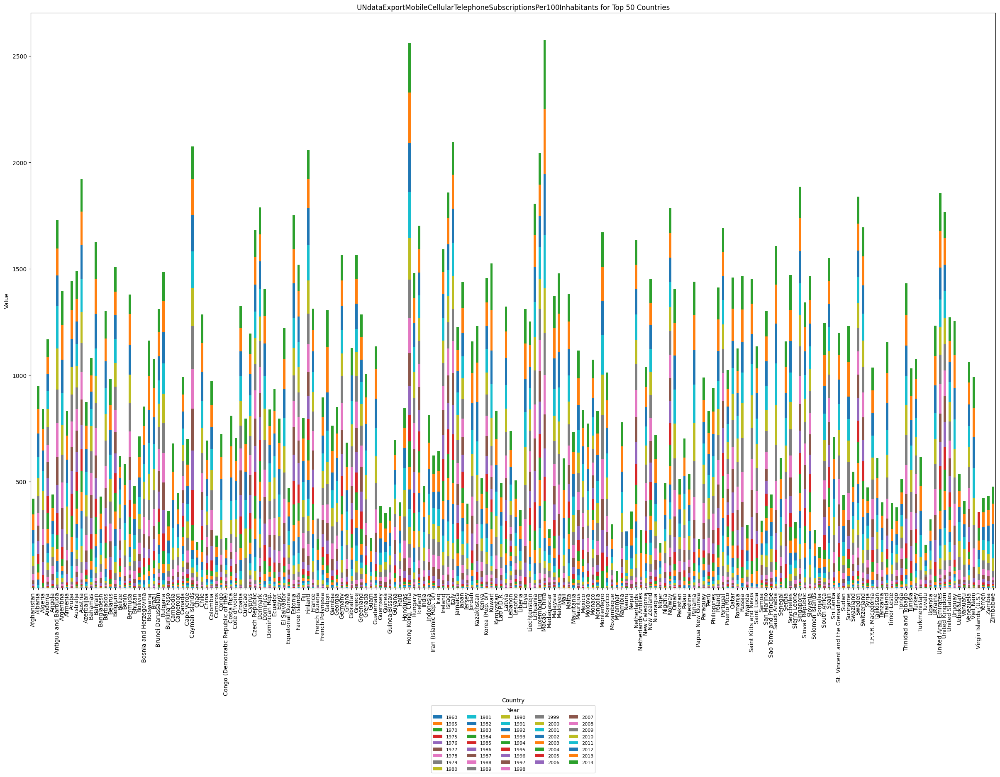

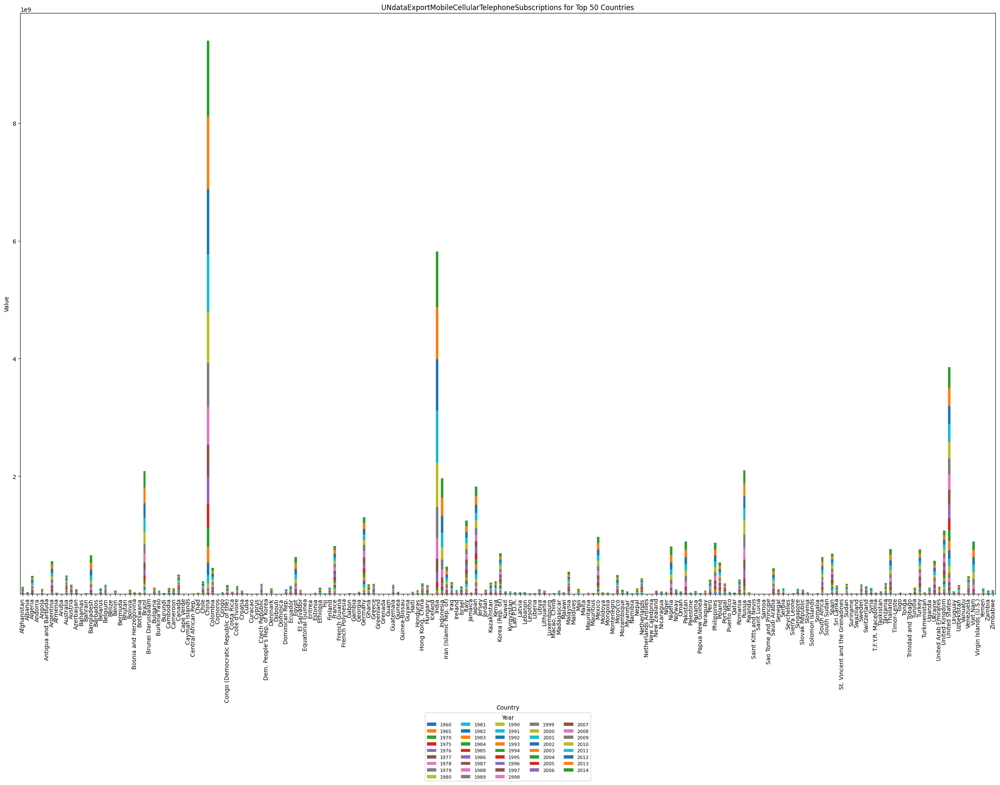

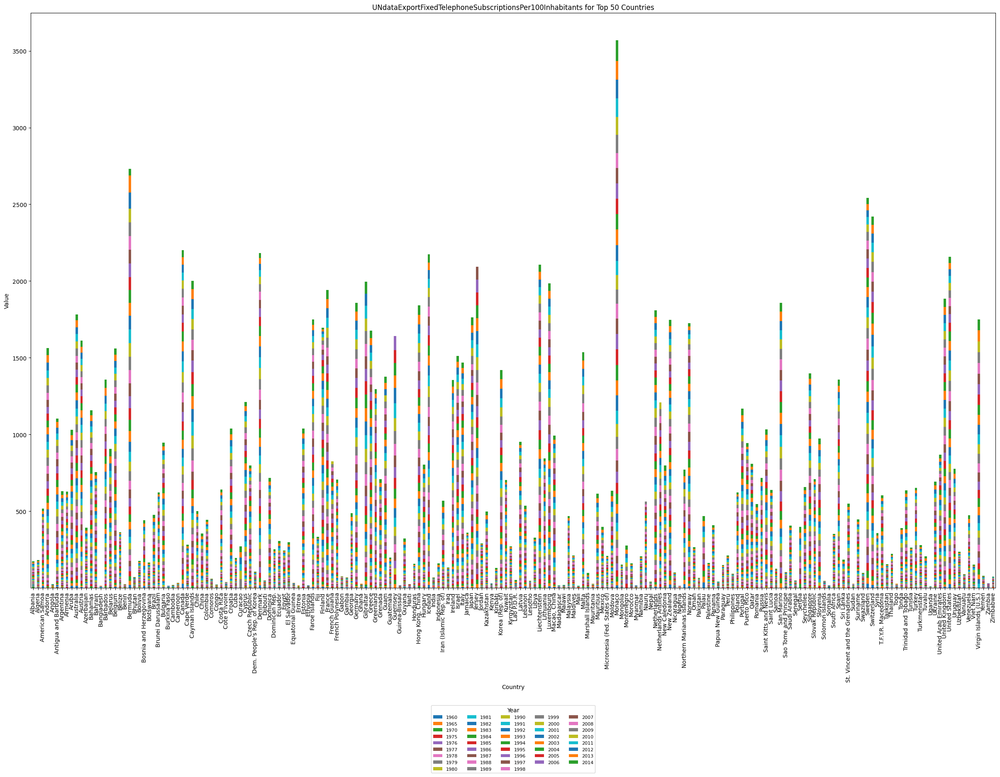

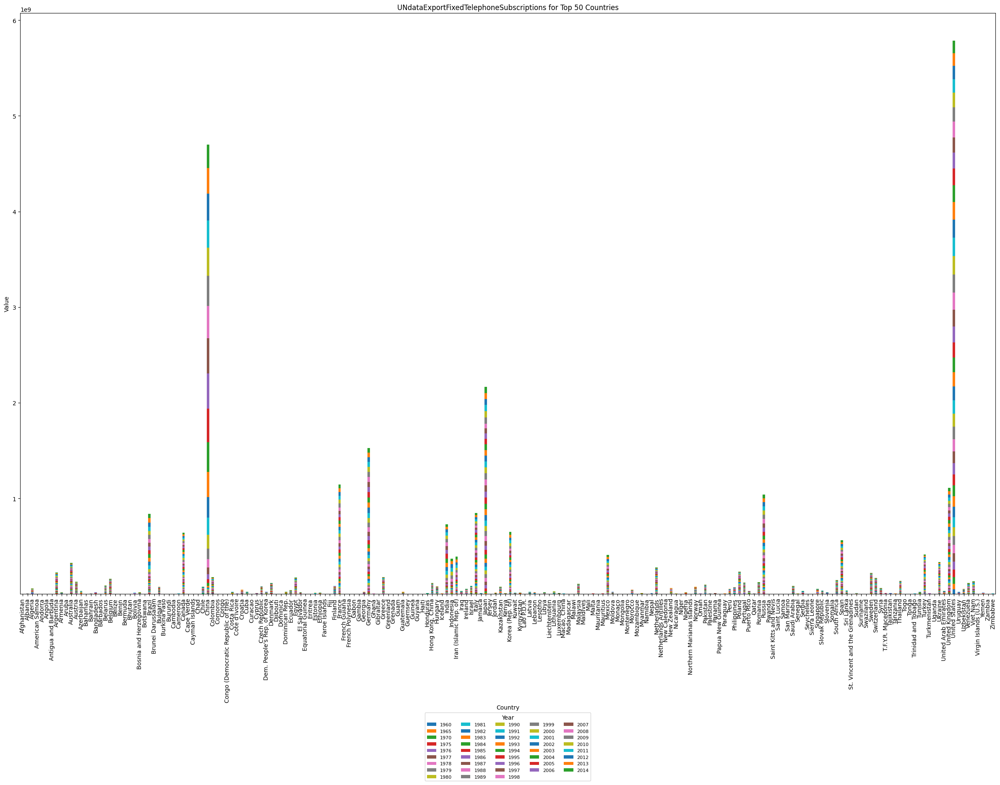

In [72]:
# Define the clean_data function
def clean_data(df):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 
             'UNdataExportMobileCellularTelephoneSubscriptions.csv', 
             'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 
             'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Get the top 50 countries
    top_50 = df_pivot.max().sort_values(ascending=False).head(200).index.tolist()
    # Filter the data to include only the top 50 countries
    df_top_50 = df[df['Country'].isin(top_50)]
    # Pivot the filtered data
    df_top_50_pivot = df_top_50.pivot(index='Country', columns='Year', values='Value')
  # Create the bar chart
    df_top_50_pivot.plot(kind='bar', stacked=True, figsize=(30, 18))
    plt.xlabel('Country')
    plt.ylabel('Value')
    plt.title(csv_file.split('.')[0] + ' for Top 50 Countries')

    # Get the unique years in the dataset
    unique_years = sorted(df['Year'].unique())

    # Set custom x-axis ticks based on the unique years
    plt.xticks(ticks=range(len(df_top_50_pivot.index)), labels=df_top_50_pivot.index, rotation=90)
    plt.legend(title='Year', labels=unique_years, fontsize=8, ncol=5, loc='upper center', bbox_to_anchor=(0.5, -0.2))
    plt.show()


Alphabetically sorted legend for these again does not tell us much

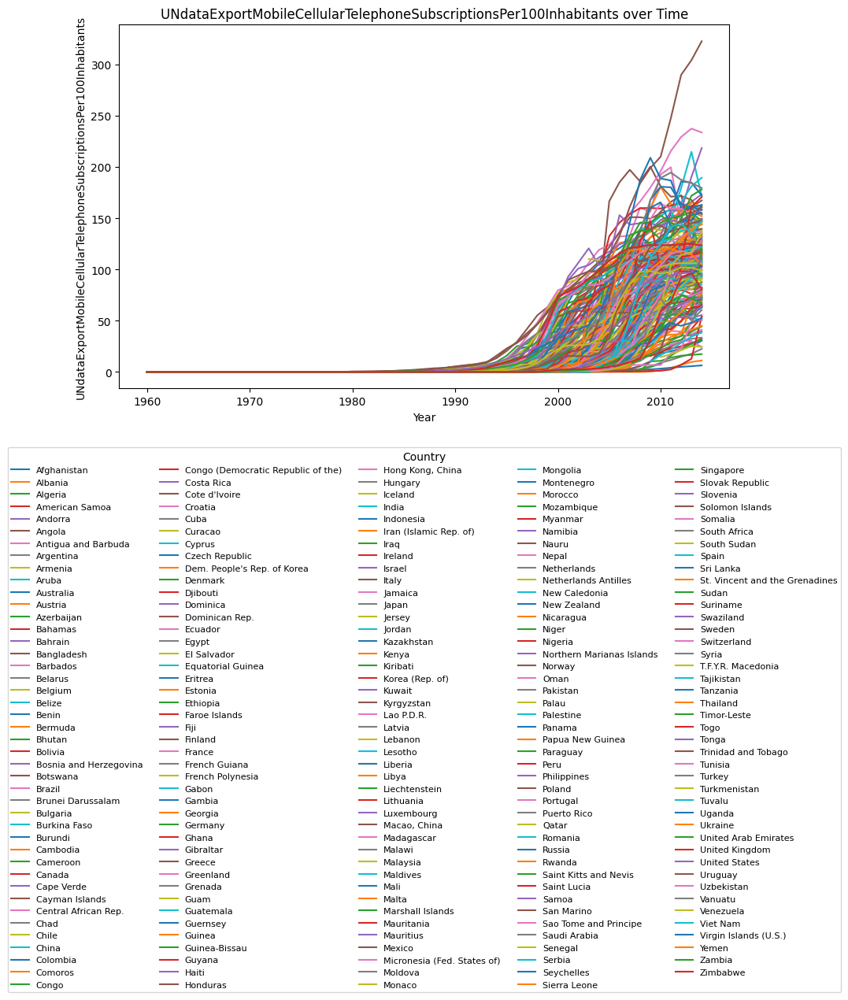

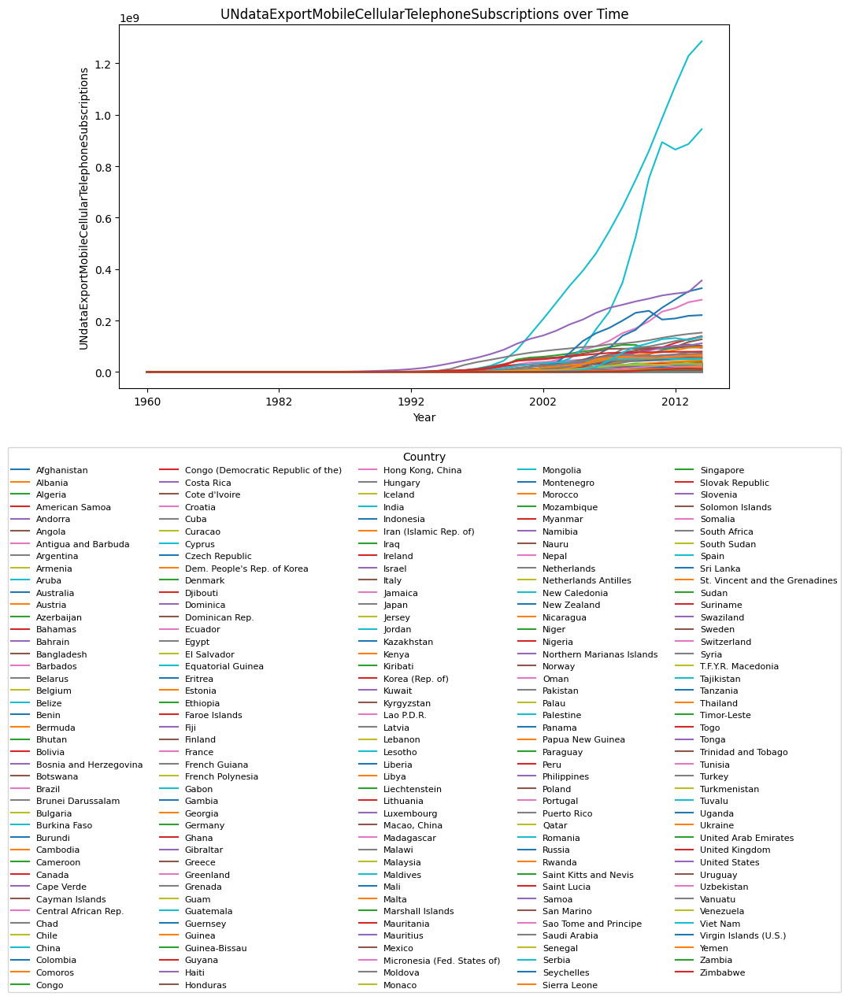

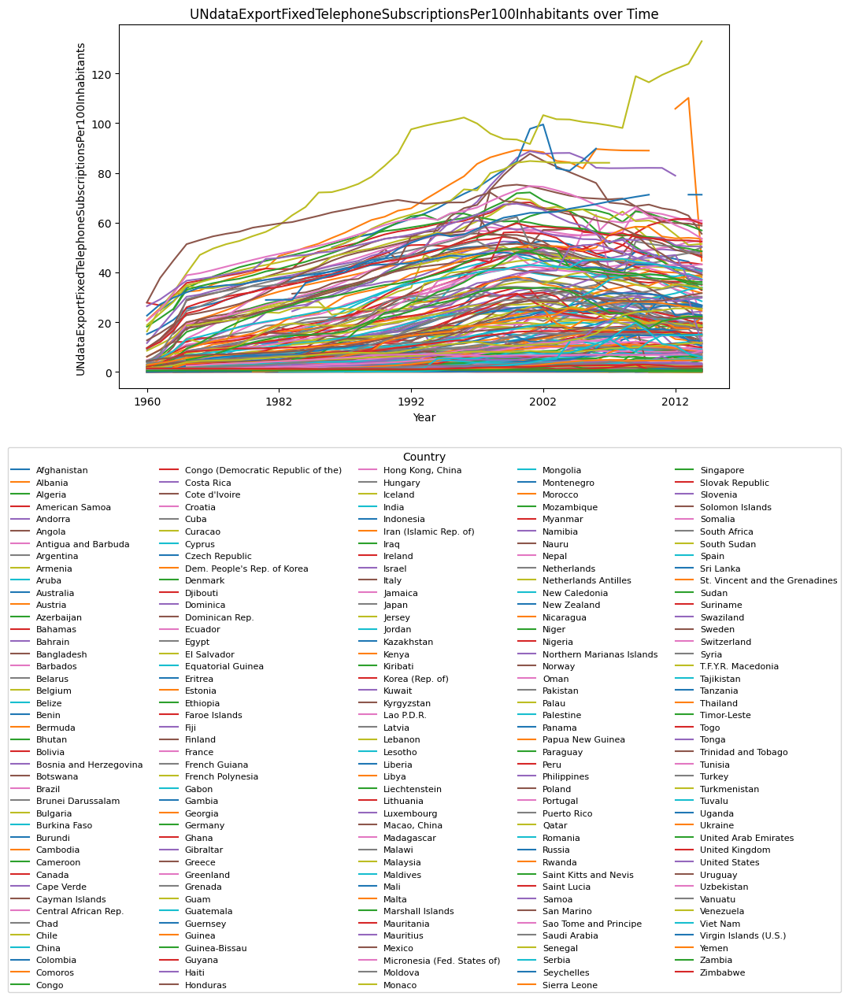

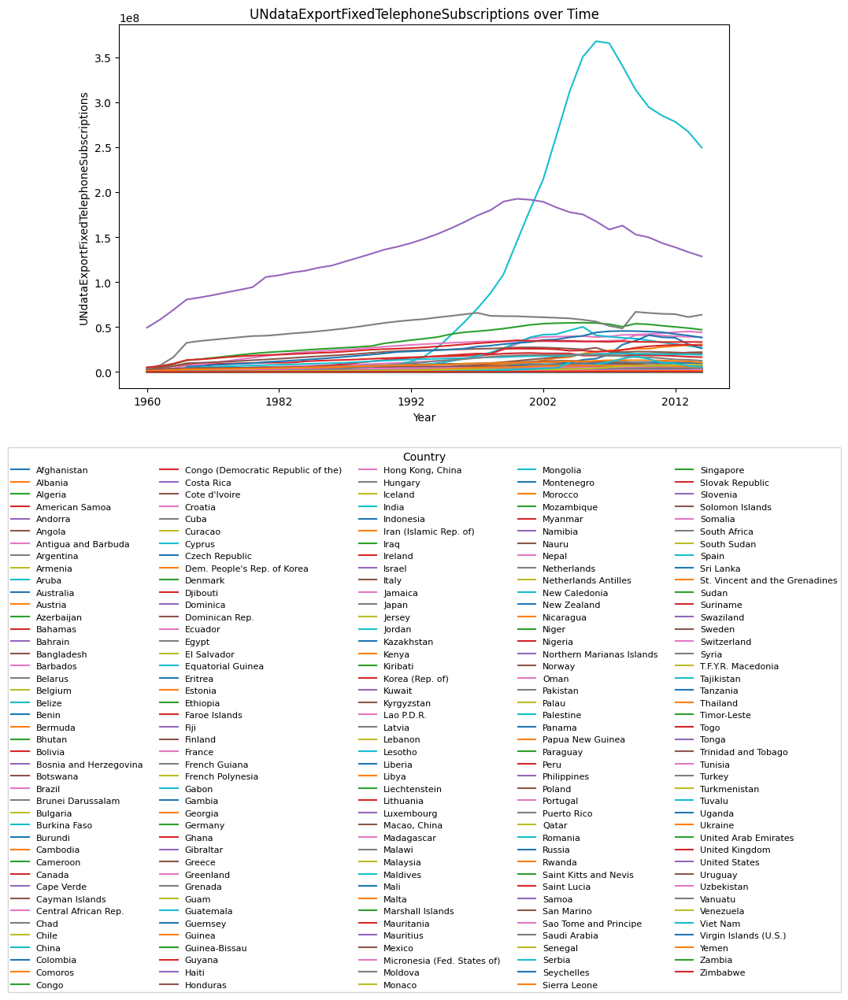

In [26]:

def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Move the legend to below the chart
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

    plt.show()


Maybe sorting legends by highest value in highest year could help use gleam more information from the data

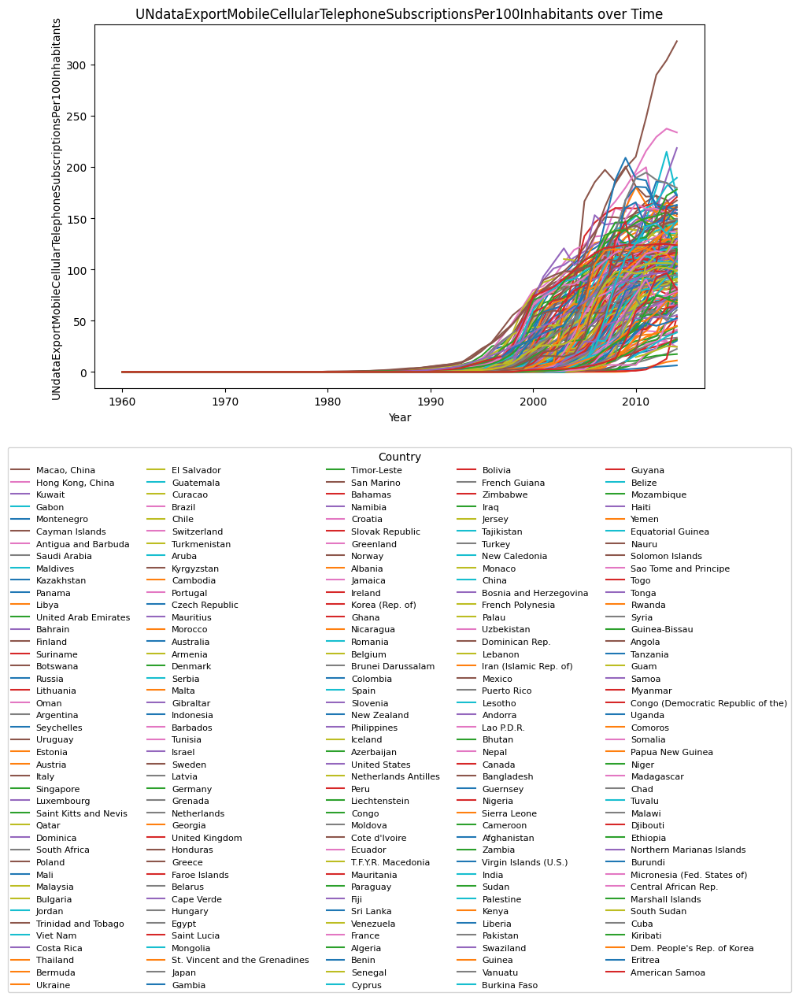

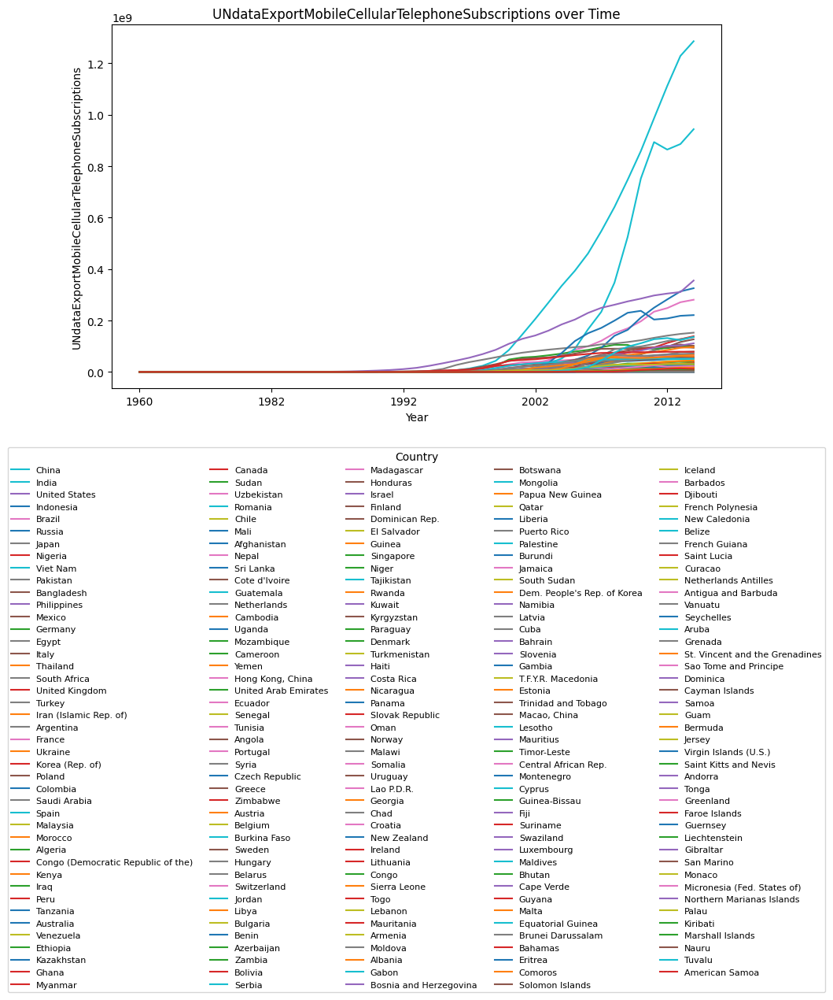

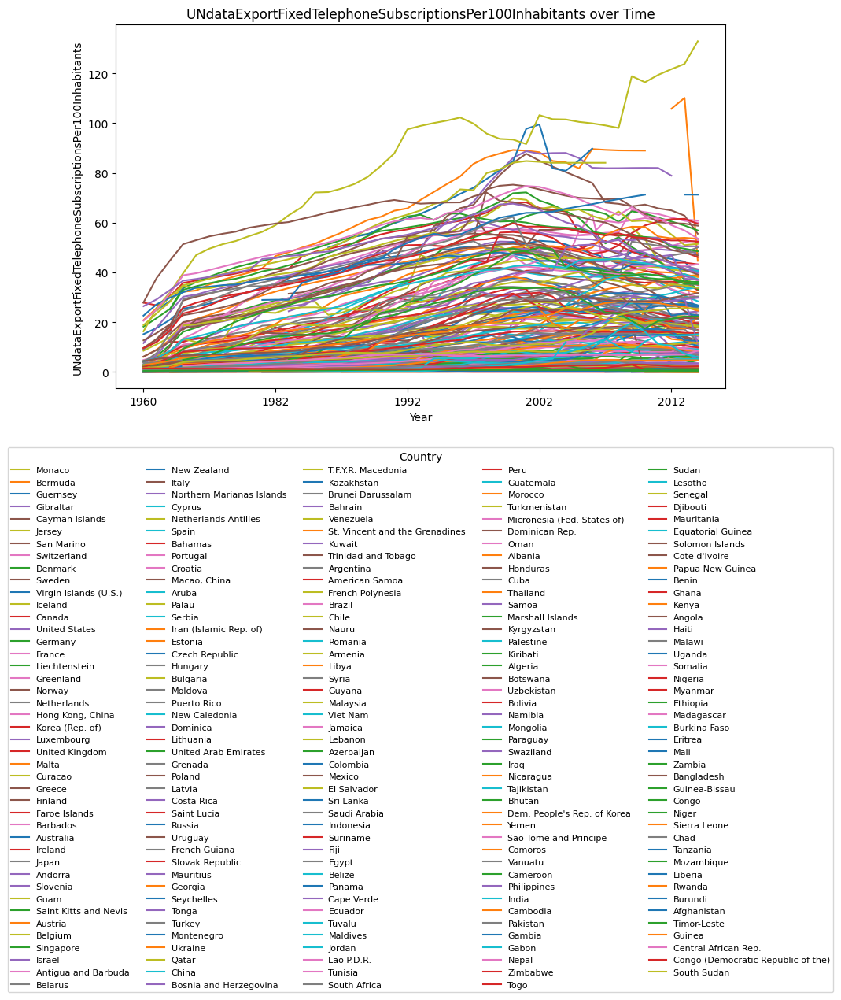

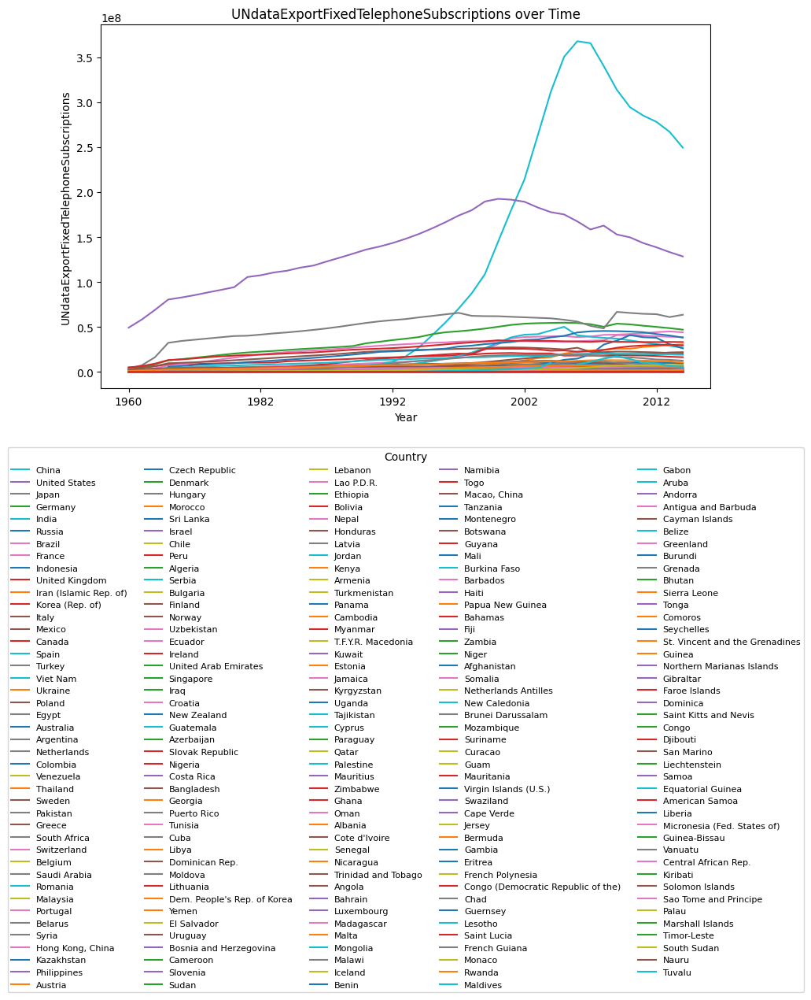

In [47]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Calculate the maximum value for each country in the current chart
    max_values_current = df_pivot.max().sort_values(ascending=False)
    sorted_countries = max_values_current.index.tolist()

    # Get the legend handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()

    # Pair the handles and labels and sort them based on the sorted_countries list
    sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: sorted_countries.index(x[1]))

    # Unzip the handles and labels
    sorted_handles, sorted_labels = zip(*sorted_handles_labels)

    # Move the legend to below the chart and sort by maximum value
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15), handles=sorted_handles, labels=sorted_labels)

    plt.show()

In [48]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go

# Define the clean_data function
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Initialize an empty list to store the traces for all the files
traces = []

# Loop over each CSV file
for i, csv_file in enumerate(csv_files):
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])

    # Create an empty list to store the traces for the current file
    current_traces = []

    # Create a trace for each country
    for country in df_pivot.columns:
        trace = go.Scatter(x=df_pivot.index, y=df_pivot[country], mode='lines', name=country, legendgroup=country,
                           hovertemplate='%{y} %{name} in %{x}', line=dict(width=1))
        current_traces.append(trace)

    # Set the maximum value for each country as its legend rank
    max_values = df_pivot.max().to_dict()
    for trace in current_traces:
        trace['legendrank'] = max_values.get(trace['name'])

    # Show the legend for the last plot
    show_legend = True if i == len(csv_files) - 1 else False

    # Create the plot layout
    layout = go.Layout(title=csv_file.split('.')[0] + ' over Time',
                       xaxis=dict(title='Year'),
                       yaxis=dict(title=csv_file.split('.')[0]),
                       legend=dict(itemsizing='constant', orientation='h', xanchor='center', x=0.5, y=-0.15, traceorder='reversed'),
                       showlegend=show_legend)

    # Create the plot figure with traces for the current file
    fig = go.Figure(data=current_traces, layout=layout)

    # Show the figure
    fig.show()


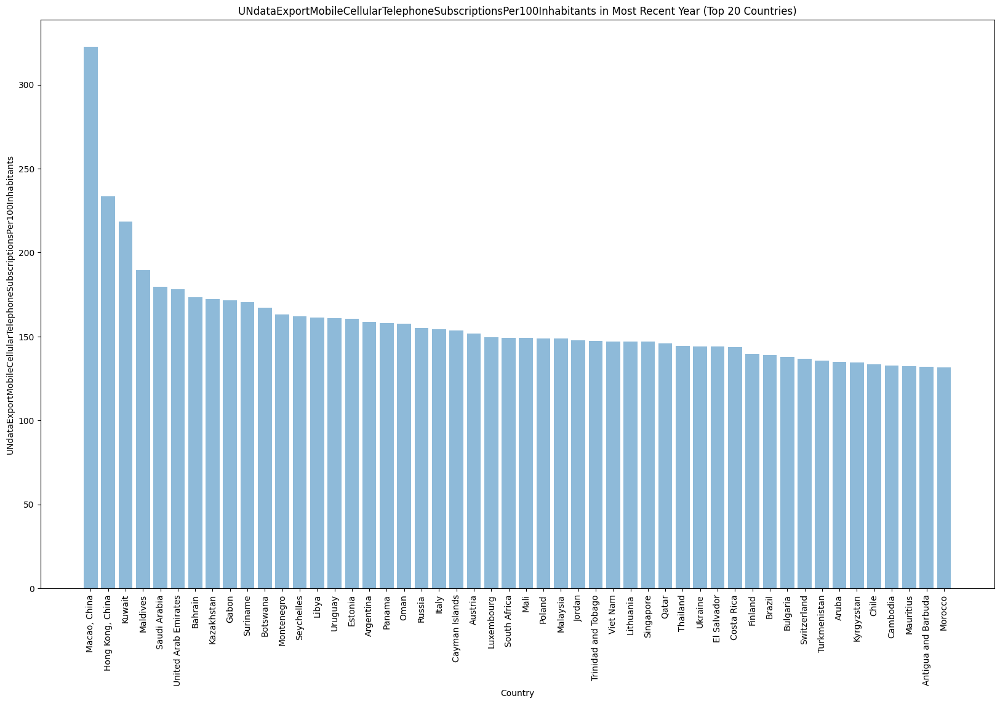

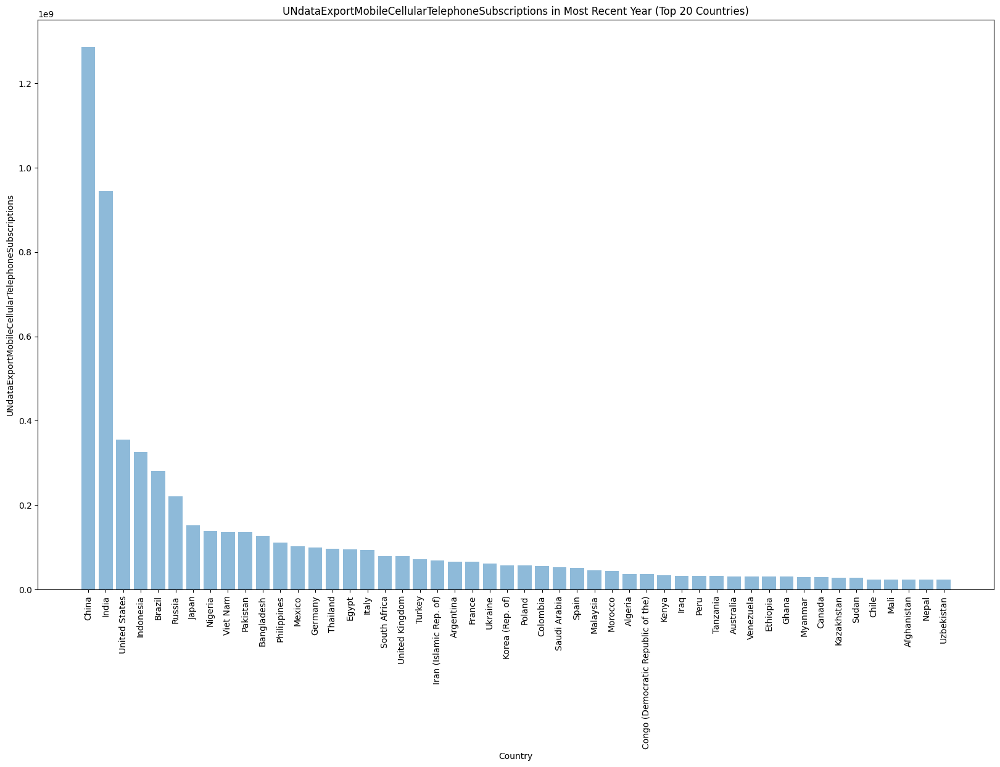

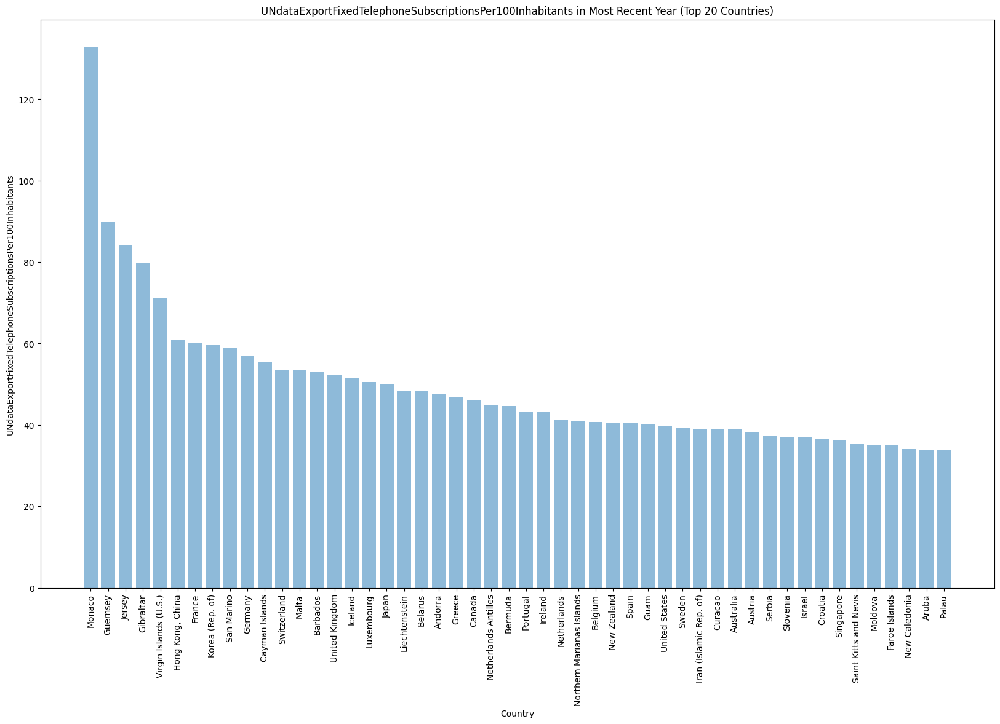

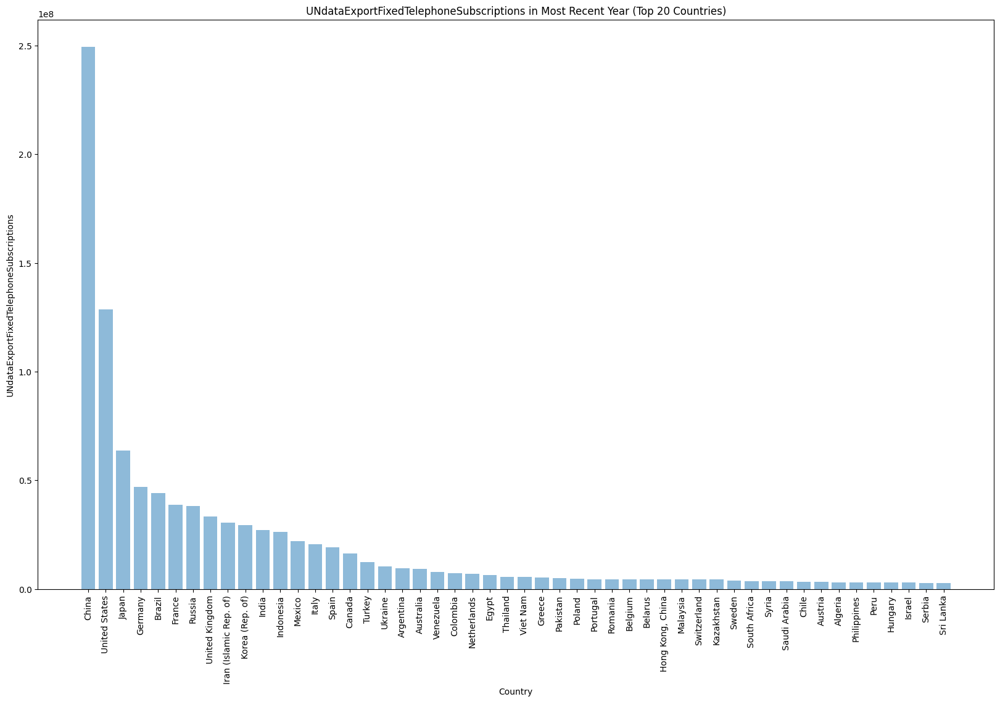

In [7]:
#import pandas as pd
#import matplotlib.pyplot as plt

def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

for csv_file in csv_files:
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    df = clean_data(df, csv_file.split('.')[0])
    
    # Convert the 'Year' column to an integer
    df['Year'] = df['Year'].astype(int)
    
    # Keep only the most recent year for each country
    df_most_recent = df.loc[df.groupby('Country')['Year'].idxmax()]
    
    # Sort the data by the value and keep the top 20 countries
    df_most_recent = df_most_recent.sort_values(by=csv_file.split('.')[0], ascending=False).head(50)
    
    # Create bar plot
    fig, ax = plt.subplots(figsize=(20, 12))
    ax.bar(df_most_recent['Country'], df_most_recent[csv_file.split('.')[0]], alpha=0.5)
    
    # Set plot title, x-axis label, and y-axis label
    ax.set_title(csv_file.split('.')[0] + ' in Most Recent Year (Top 50 Countries)')
    ax.set_xlabel('Country')
    ax.set_ylabel(csv_file.split('.')[0])
    
    # Rotate x-axis labels
    plt.xticks(rotation=90)
    
    # Show plot
    plt.show()




mobile top 100 per capita and bottom 100 fixed telephone subscription per capita 

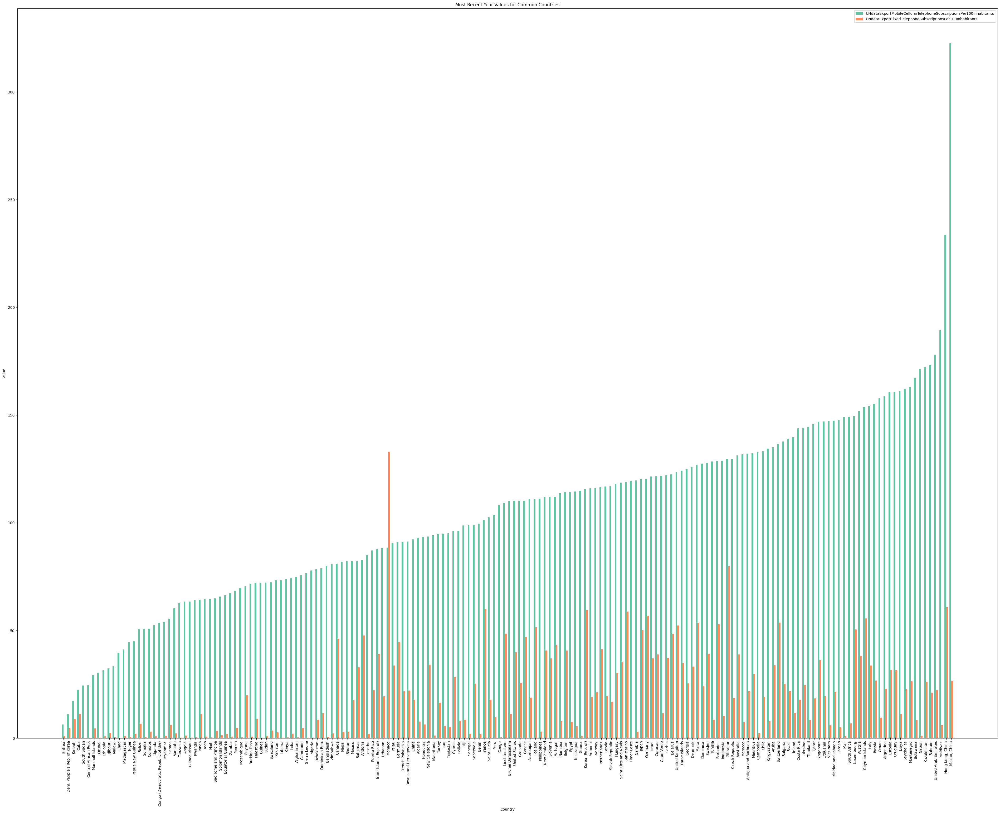

In [16]:

def clean_data(df, value_column_name, num_countries):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    
    # Remove non-numeric years and convert the 'Year' column to an integer data type
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df = df.dropna(subset=['Year'])
    df['Year'] = df['Year'].astype(int)
    
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year', value_column_name])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']

    # Get the most recent year's data for each country
    df_recent_year = df.loc[df.groupby('Country')['Year'].idxmax()]

    # Select the top and bottom num_countries
    df_top = df_recent_year.nlargest(num_countries, value_column_name)
    df_bottom = df_recent_year.nsmallest(num_countries, value_column_name)

    # Combine the top and bottom data frames
    df_combined = pd.concat([df_top, df_bottom], axis=0)

    return df_combined
    # Combine the top and bottom data frames


# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv']

# Initialize an empty list to store the top and bottom countries
top_countries = []
bottom_countries = []

# Loop over each CSV file to get top and bottom countries
for idx, csv_file in enumerate(csv_files):
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df_cleaned = clean_data(df, csv_file.split('.')[0], 100)

    # Get the unique country names
    countries = df_cleaned['Country'].unique()

    if idx == 0:
        top_countries = countries
    elif idx == 1:
        bottom_countries = countries

# Find common countries
common_countries = list(set(top_countries) & set(bottom_countries))

# Initialize an empty DataFrame to store the recent year's data for each common country
combined_recent_years = pd.DataFrame()

# Loop over each CSV file again to get the most recent year's data for each common country
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df_cleaned = clean_data(df, csv_file.split('.')[0], 100)

    # Filter the data to include only common countries
    df_common = df_cleaned[df_cleaned['Country'].isin(common_countries)]

    # Get the most recent year's data for each common country
    df_recent_year = df_common.loc[df_common.groupby('Country')['Year'].idxmax()]

    # Add the recent year's data to the combined DataFrame
    if combined_recent_years.empty:
        combined_recent_years = df_recent_year
    else:
        combined_recent_years = pd.merge(combined_recent_years, df_recent_year, on=['Country', 'Year'])

# Sort the combined DataFrame by the value from the first CSV file
combined_recent_years_sorted = combined_recent_years.sort_values(by=csv_files[0].split('.')[0])

# Create the bar plot
plt.figure(figsize=(48, 36))
bar_width = 0.35
index = pd.Index(range(len(combined_recent_years_sorted)))

bar1 = plt.bar(index, combined_recent_years_sorted[csv_files[0].split('.')[0]], width=bar_width, label=csv_files[0].split('.')[0])
bar2 = plt.bar(index + bar_width, combined_recent_years_sorted[csv_files[1].split('.')[0]], width=bar_width, label=csv_files[1].split('.')[0])

plt.xlabel('Country')
plt.ylabel('Value')
plt.title('Most Recent Year Values for Common Countries')
plt.xticks(index + bar_width / 2, combined_recent_years_sorted['Country'].unique(), rotation=90)
plt.legend()

# Show plot
plt.show()


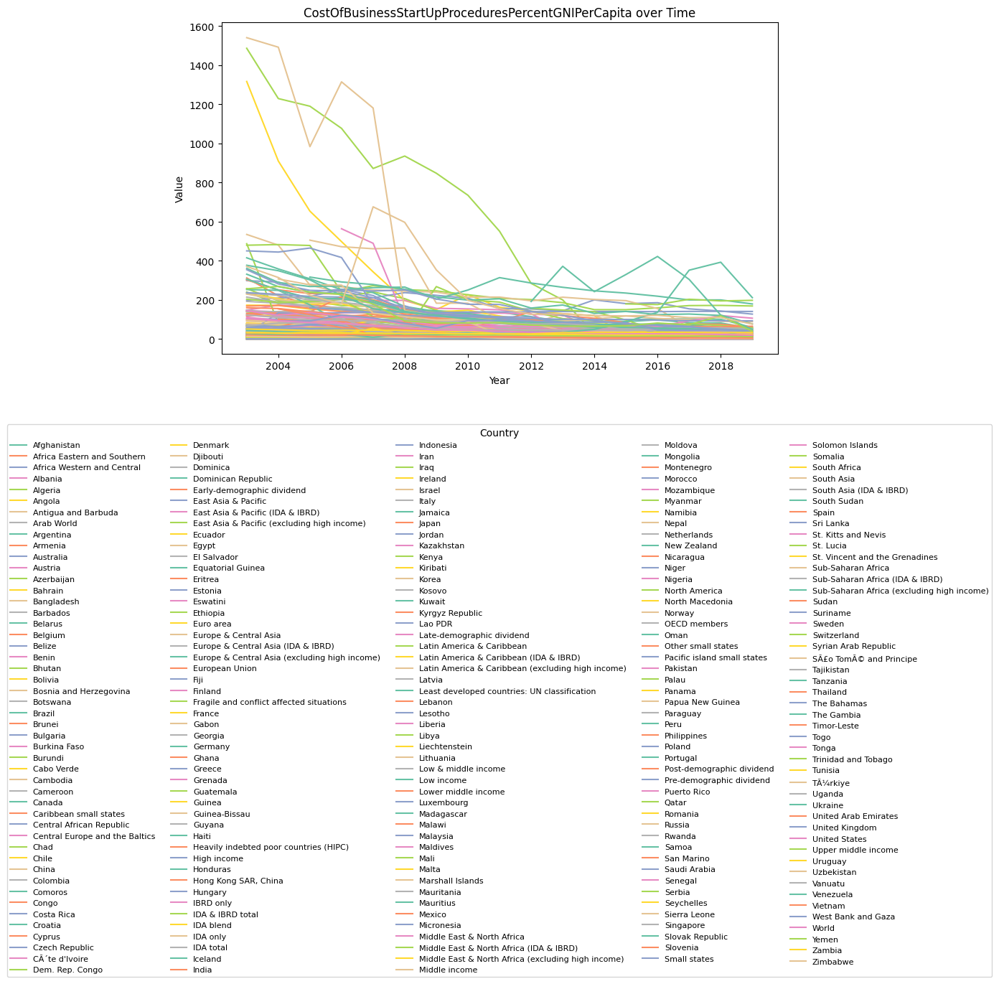

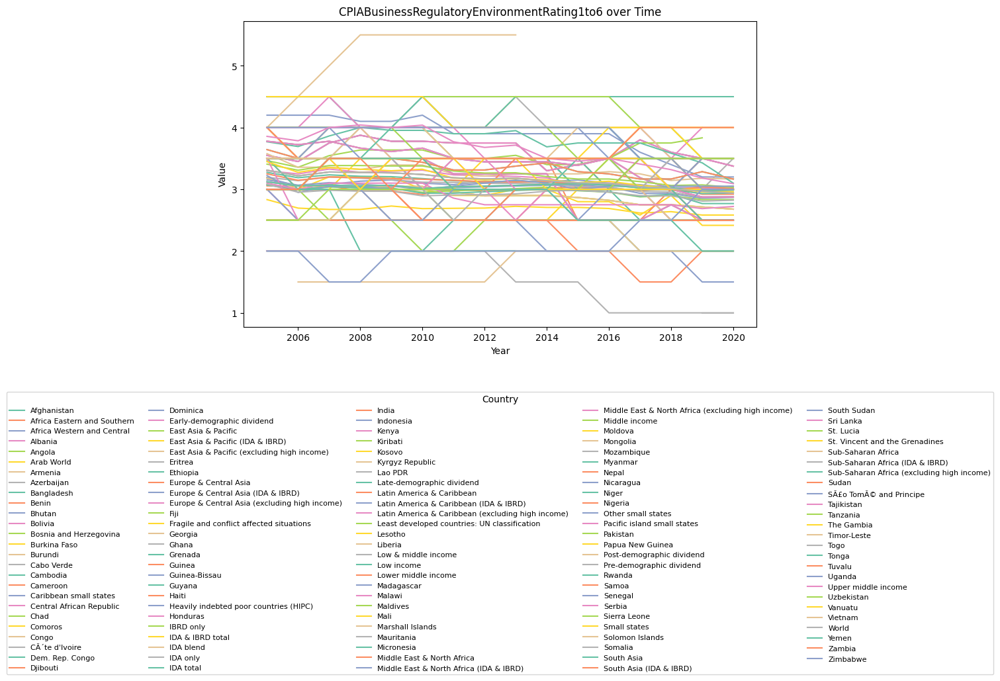

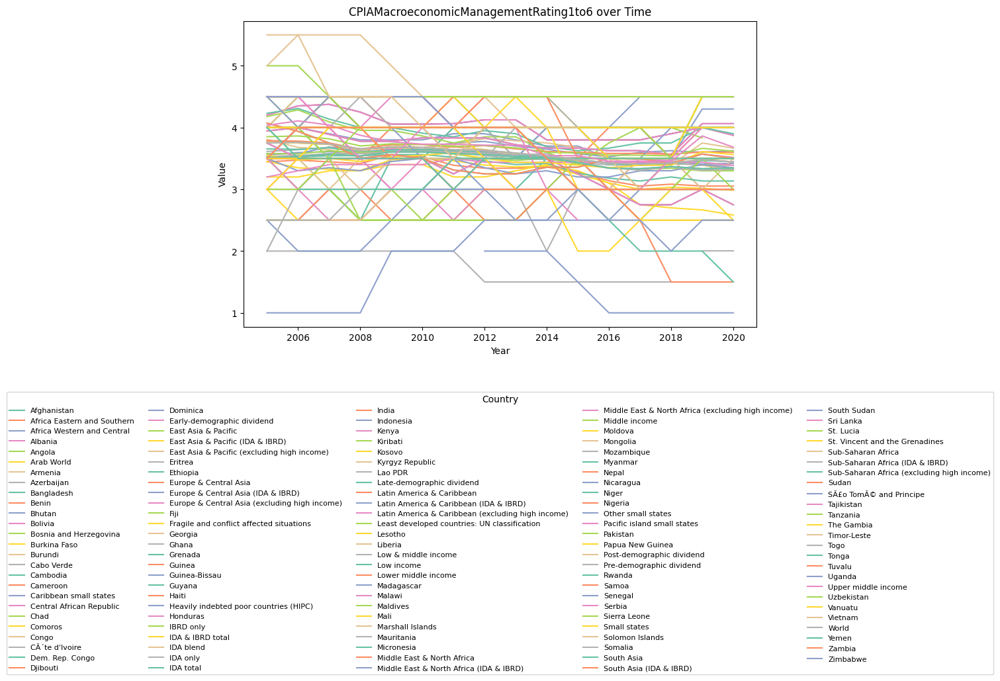

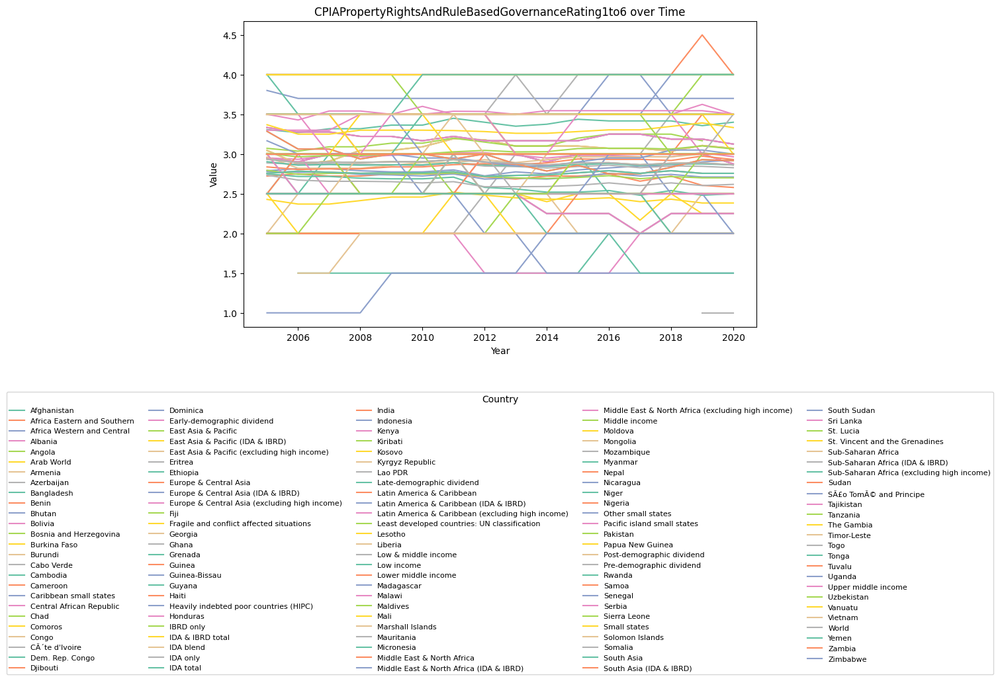

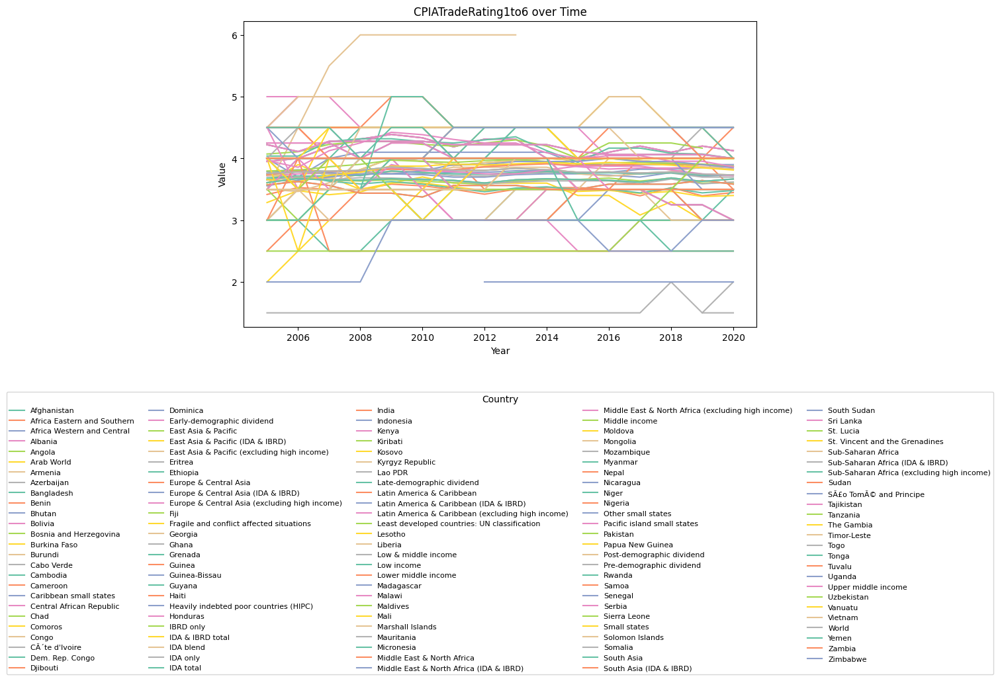

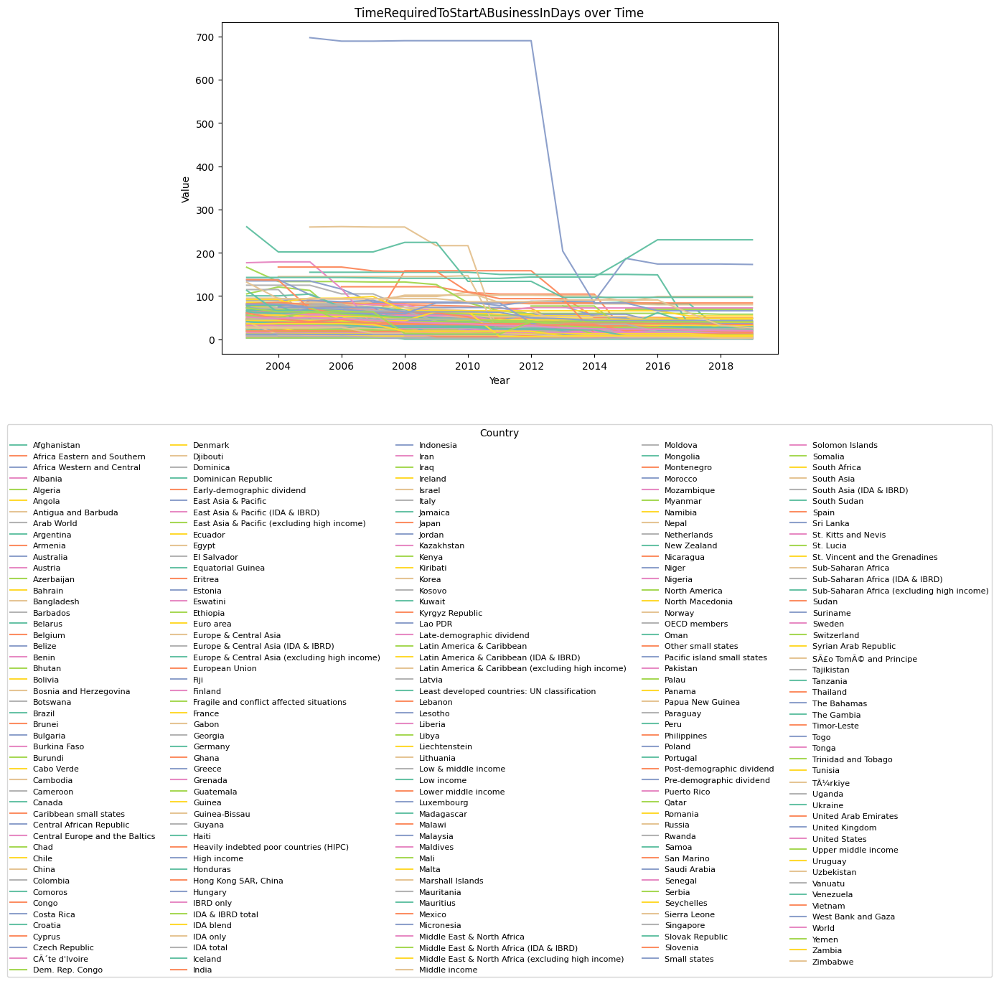

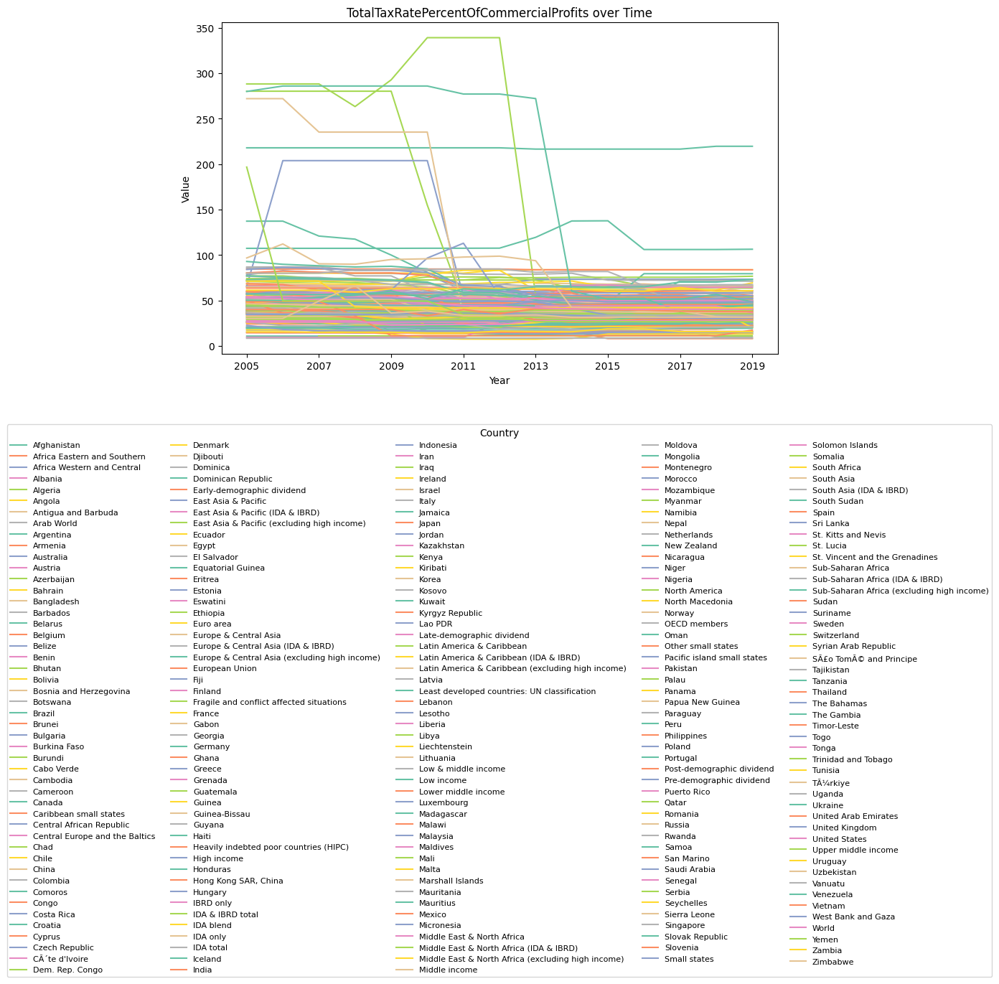

In [14]:
 # Define the clean_data function
def clean_data(df):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove rows with numeric country names or 'footnoteSeqID'
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['CostOfBusinessStartUpProceduresPercentGNIPerCapita.csv',
             'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
             'CPIAMacroeconomicManagementRating1to6.csv',
             'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
             'CPIATradeRating1to6.csv',
             'TimeRequiredToStartABusinessInDays.csv',
             'TotalTaxRatePercentOfCommercialProfits.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title(csv_file.split('.')[0] + ' over Time')
    plt.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))
    plt.show()


'CostOfBusinessStartUpProceduresPercentGNIPerCapita.csv',
             'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
             'CPIAMacroeconomicManagementRating1to6.csv',
             'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
             'CPIATradeRating1to6.csv',
             'TimeRequiredToStartABusinessInDays.csv'
Alphabetic Legend

Ratings by tax

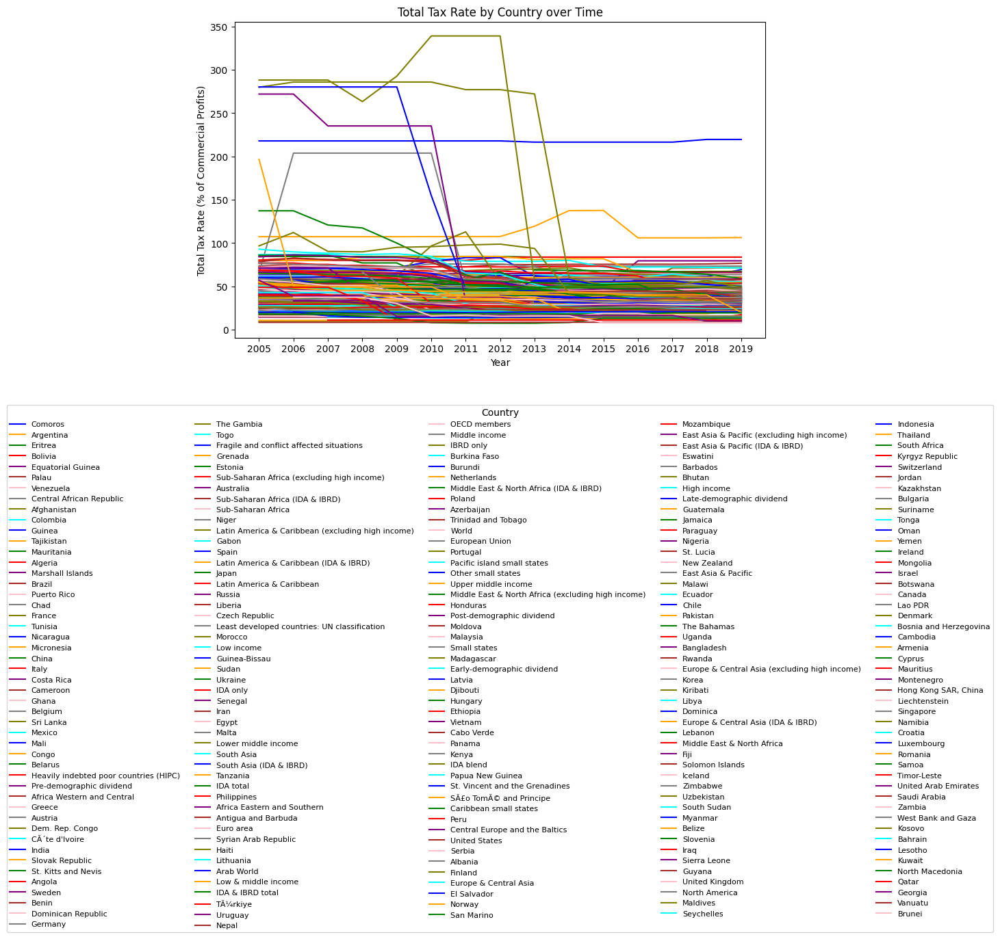

In [84]:
def clean_data(df):
    # Remove the Value Footnotes and footnoteSeqID columns
    df = df.drop(columns=['Value Footnotes'])
    # Rename the columns
    df.columns = ['Country', 'Year', 'Value']
    # Drop any duplicate entries for a given year and country combination
    df = df.drop_duplicates(subset=['Country', 'Year'], keep='last')
    # Drop any rows where the Value column is NaN
    df = df.dropna(subset=['Value'])
    # Convert the Value column to numeric
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    # Remove the last three rows
    df = df[:-3]
    return df

# Define a list of CSV files
csv_files = ['TotalTaxRatePercentOfCommercialProfits.csv']

# Create a list of colors for the countries
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create a figure and axes object
fig, ax = plt.subplots(figsize=(10,6))

# Set the color cycle to use a different color for each country
ax.set_prop_cycle(color=colors)

# Loop over each CSV file
for i, csv_file in enumerate(csv_files):
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Sort the data by the most recent year
    df_pivot = df_pivot.sort_values(by=df_pivot.index[-1], axis=1, ascending=False)
    # Plot each country's line on the same axis
    for country in df_pivot.columns:
        ax.plot(df_pivot.index, df_pivot[country], label=country)
        
# Set the x- and y-axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Total Tax Rate (% of Commercial Profits)')
ax.set_title('Total Tax Rate by Country over Time')

# Add a legend to the plot
ax.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))

# Show the plot
plt.show()



Strip anything over 100%

TypeError: clean_data() missing 1 required positional argument: 'value_column_name'

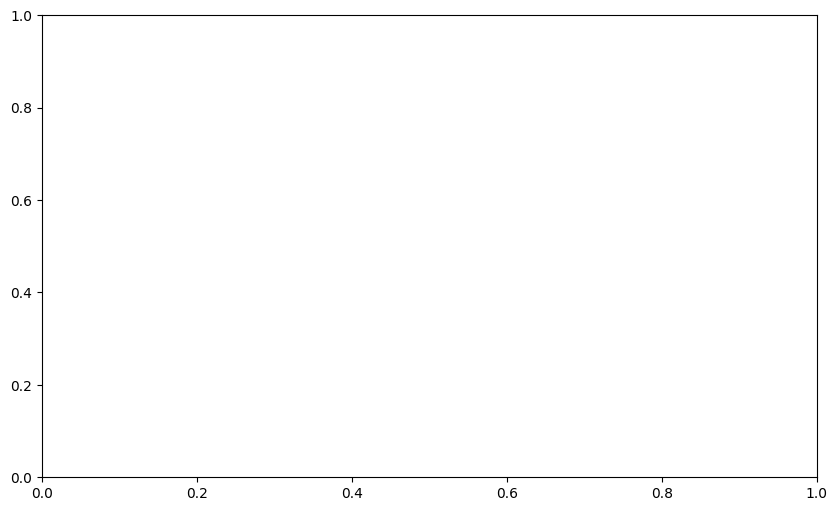

In [25]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df = df.dropna(subset=['Year'])
    df['Year'] = df['Year'].astype(int)
    df = df.drop_duplicates(subset=['Country', 'Year'])
    
    # Remove values over 100
    df = df[df[value_column_name] <= 100]
    
    df_recent_year = df.loc[df.groupby('Country')['Year'].idxmax()]
    return df_recent_year

# Define a list of CSV files
csv_files = ['TotalTaxRatePercentOfCommercialProfits.csv']

# Create a list of colors for the countries
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create a figure and axes object
fig, ax = plt.subplots(figsize=(10,6))

# Set the color cycle to use a different color for each country
ax.set_prop_cycle(color=colors)

# Loop over each CSV file
for i, csv_file in enumerate(csv_files):
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Sort the data by the most recent year
    df_pivot = df_pivot.sort_values(by=df_pivot.index[-1], axis=1, ascending=False)
    # Plot each country's line on the same axis
    for country in df_pivot.columns:
        ax.plot(df_pivot.index, df_pivot[country], label=country)
        
# Set the x- and y-axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Total Tax Rate (% of Commercial Profits)')
ax.set_title('Total Tax Rate by Country over Time')

# Add a legend to the plot
ax.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))

# Show the plot
plt.show()






In [39]:

csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptions.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        # Read the header
        header = next(reader)
        valid_lines = [header]

        # Read the rest of the lines and keep only the valid ones
        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

# Assuming all CSVs have the same format: Country, Year, Value
def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read and process all CSV files
dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

# Find the top 50 countries in each file
top_50_countries_list = [set(df.sort_values(by='Value', ascending=False).drop_duplicates(subset=['Country'])['Country'].head(50)) for df in dataframes]

# Find the intersection of top 50 countries in each file
common_top_50_countries = set.intersection(*top_50_countries_list)

# Print top 50 countries for each dataset
for i, countries in enumerate(top_50_countries_list):
    print(f"Top 50 countries for dataset {i + 1}:")
    print(sorted(list(countries)))
    print()

# Print common top 50 countries
print("Intersection of top 50 countries:")
print(sorted(list(common_top_50_countries)))
# Print top 50 countries for each dataset
for i, countries in enumerate(top_50_countries_list):
    print(f"Top 50 countries for dataset {i + 1}:")
    print(sorted(list(countries)))
    print()

# Print common top 50 countries
print("Intersection of top 50 countries:")
print(sorted(list(common_top_50_countries)))
# Filter data for the common top 50 countries
filtered_dataframes = [df[df['Country'].isin(common_top_50_countries)] for df in dataframes]

# Merge the dataframes on 'Country' and 'Year' columns
merged_df = filtered_dataframes[0]
for i in range(1, len(filtered_dataframes)):
    merged_df = pd.merge(merged_df, filtered_dataframes[i], on=['Country', 'Year'], suffixes=(f'_file{i}', f'_file{i + 1}'))

# Pivot the data to have years as rows and values as columns for each file
pivoted_dataframes = [merged_df.pivot(index='Year', columns='Country', values=f'Value_file{i + 1}') for i in range(len(filtered_dataframes))]

# Create line charts for each file
for i, pivoted_df in enumerate(pivoted_dataframes):
    if not pivoted_df.empty:
        print(pivoted_df.head())  # Print the first few rows of the pivoted DataFrame
        pivoted_df.plot(figsize=(10, 6))
        plt.xlabel('Year')
        plt.ylabel('Value')
        plt.title(f'Time Series for Common Top 50 Countries in File {i + 1}')
        plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))
        plt.show()
    else:
        print(f"No data to plot for File {i + 1}")

Top 50 countries for dataset 1:
['Afghanistan', 'Algeria', 'Argentina', 'Australia', 'Bangladesh', 'Brazil', 'Canada', 'Chile', 'China', 'Colombia', 'Congo (Democratic Republic of the)', 'Egypt', 'Ethiopia', 'France', 'Germany', 'Ghana', 'India', 'Indonesia', 'Iran (Islamic Rep. of)', 'Iraq', 'Italy', 'Japan', 'Kazakhstan', 'Kenya', 'Korea (Rep. of)', 'Malaysia', 'Mali', 'Mexico', 'Morocco', 'Myanmar', 'Nigeria', 'Pakistan', 'Peru', 'Philippines', 'Poland', 'Romania', 'Russia', 'Saudi Arabia', 'South Africa', 'Spain', 'Sudan', 'Tanzania', 'Thailand', 'Turkey', 'Ukraine', 'United Kingdom', 'United States', 'Uzbekistan', 'Venezuela', 'Viet Nam']

Top 50 countries for dataset 2:
['Andorra', 'Aruba', 'Australia', 'Austria', 'Bahamas', 'Bahrain', 'Barbados', 'Belgium', 'Bermuda', 'Canada', 'Cayman Islands', 'Chile', 'Czech Republic', 'Denmark', 'Estonia', 'Faroe Islands', 'Finland', 'France', 'Germany', 'Guernsey', 'Hong Kong, China', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Japan', 'Kor

In [44]:
def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)

dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])

# Print common top 100 countries in datasets 1 and 2
print("Intersection of top 100 countries in datasets 1 and 2:")
print(sorted(list(common_top_100_datasets_1_and_2),))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Intersection of top 100 countries in datasets 3, 4, 5, and 6:")
print(sorted(list(common_top_100_datasets_3_to_6)))

Intersection of top 100 countries in datasets 1 and 2:
['Antigua and Barbuda', 'Argentina', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cayman Islands', 'Chile', 'Colombia', 'Costa Rica', 'Czech Republic', 'Denmark', 'Dominica', 'Estonia', 'Faroe Islands', 'Finland', 'Georgia', 'Germany', 'Gibraltar', 'Greece', 'Hong Kong, China', 'Hungary', 'Iceland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Korea (Rep. of)', 'Kuwait', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Macao, China', 'Malaysia', 'Maldives', 'Malta', 'Montenegro', 'Morocco', 'Netherlands', 'New Zealand', 'Norway', 'Oman', 'Poland', 'Portugal', 'Qatar', 'Russia', 'Saint Kitts and Nevis', 'San Marino', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Singapore', 'Slovak Republic', 'Slovenia', 'South Africa', 'Sweden', 'Switzerland', 'Trinidad and Tobago', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay']

Interse

Intersection of top 100 contries in the 'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', and, 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'datasets, and the intersection of top 100 contries in the 'CPIABusinessRegulatoryEnvironmentRating1to6.csv', 'CPIAMacroeconomicManagementRating1to6.csv', 'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv', and 'CPIATradeRating1to6.csv'

{'Serbia', 'Netherlands', 'Dominica', 'Seychelles', 'Montenegro', 'Morocco', 'United States', 'New Zealand', 'Iceland', 'Austria', 'South Africa', 'Argentina', 'Czech Republic', 'Hungary', 'Trinidad and Tobago', 'Slovak Republic', 'Denmark', 'Germany', 'Belgium', 'Russia', 'Liechtenstein', 'Kuwait', 'San Marino', 'Hong Kong, China', 'Luxembourg', 'Japan', 'Gibraltar', 'Portugal', 'Faroe Islands', 'Sweden', 'Bahrain', 'Finland', 'Bulgaria', 'Israel', 'Antigua and Barbuda', 'Australia', 'Malaysia', 'Colombia', 'Brazil', 'Korea (Rep. of)', 'Lithuania', 'Aruba', 'Saudi Arabia', 'Qatar', 'Singapore', 'Malta', 'Georgia', 'Kazakhstan', 'Switzerland', 'Chile', 'Italy', 'Belarus', 'Norway', 'Cayman Islands', 'Saint Kitts and Nevis', 'Costa Rica', 'Azerbaijan', 'Slovenia', 'Oman', 'Macao, China', 'Uruguay', 'Barbados', 'Estonia', 'United Arab Emirates', 'Poland', 'Latvia', 'Greece', 'Maldives', 'Brunei Darussalam', 'United Kingdom'}
{'Upper middle income', 'Guinea', 'Albania', 'IDA blend', 'Como

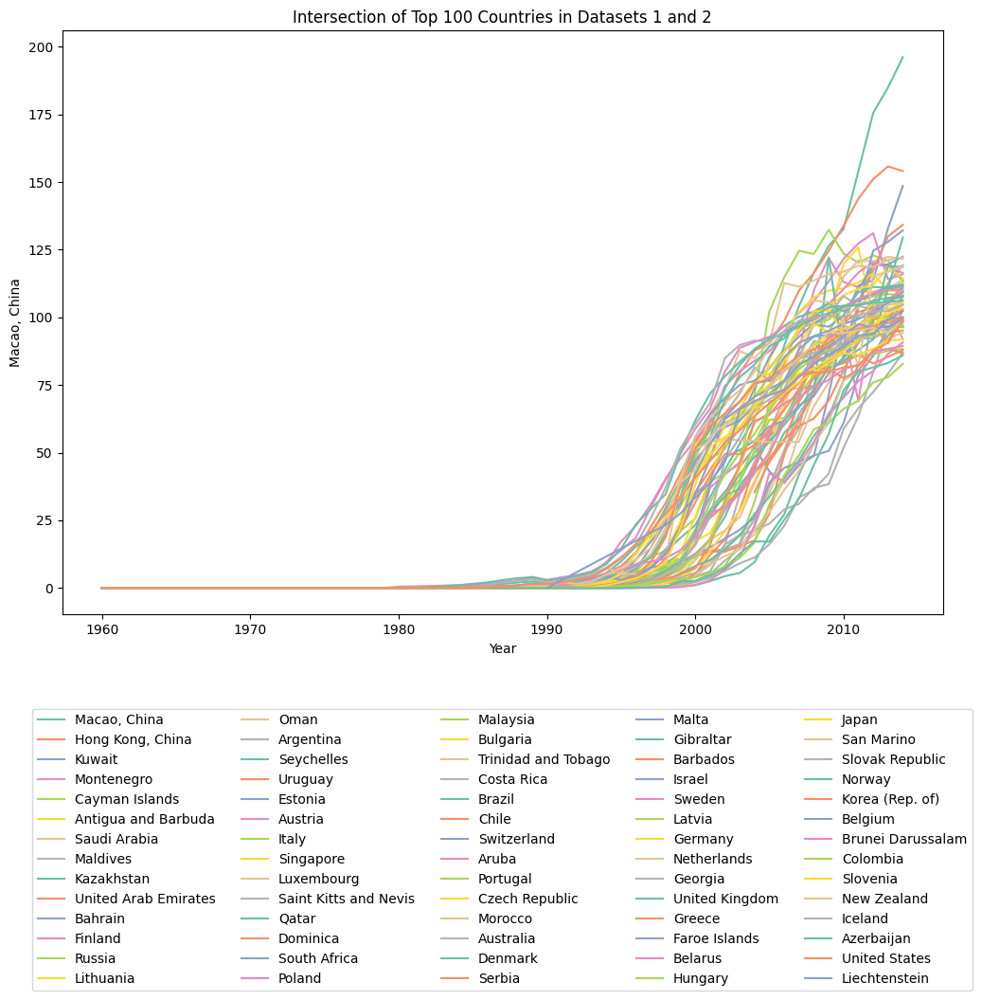

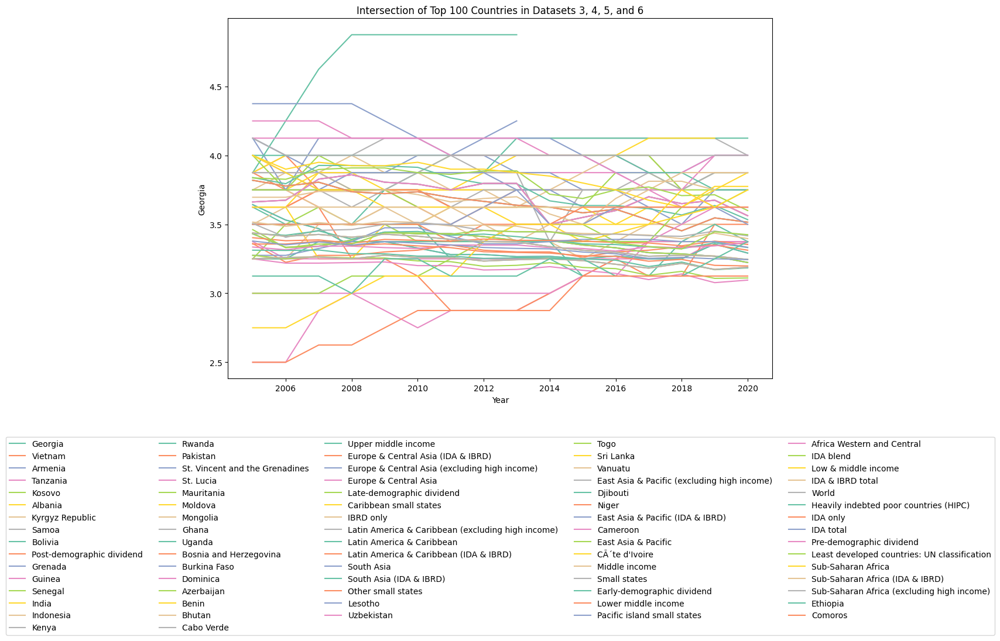

In [24]:
csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        header = next(reader)
        valid_lines = [header]

        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df
def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)

def create_line_chart(df, common_countries, title):
    df_filtered = df[df['Country'].isin(common_countries)]
    df_grouped = df_filtered.groupby(['Country', 'Year'], as_index=False).mean()
    df_pivoted = df_grouped.pivot(index='Year', columns='Country', values='Value')
    # Sort the countries based on their highest value in their most recent year
    sorted_countries = df_filtered.groupby('Country')['Value'].max().sort_values(ascending=False).index.tolist()
    plt.figure(figsize=(12, 8))
    for country in sorted_countries:
        sns.lineplot(data=df_pivoted[country], label=country)
    plt.title(title)
    plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=5)
    plt.show()

    
dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])
print(common_top_100_datasets_1_and_2)

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])
print(common_top_100_datasets_3_to_6)

# Print common top 100 countries in datasets 1 and 2
print("Check to make sure there are countries that lie at the Intersection of top 100 countries in datasets % internet users, and mobile subscriptions per 100 residents:")
print(sorted(list(common_top_100_datasets_1_and_2)))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Check to make sure there are countries that lie at the Intersection of top 100 countries in datasets Business Regulatory Environment Rating, Macroeconomic Management Rating, Property Rights And Rule Based Governance, and Trade Ratings 1 to 6:")
print(sorted(list(common_top_100_datasets_3_to_6)))

# Create line charts for the intersection of top 100 countries in datasets 1 and 2
create_line_chart(pd.concat([dataframes[0], dataframes[1]]),
                  common_top_100_datasets_1_and_2,
                  'Intersection of Top 100 Countries in Datasets 1 and 2')

# Create line charts for the intersection of top 100 countries in datasets 3, 4, 5, and 6
create_line_chart(pd.concat([dataframes[2], dataframes[3], dataframes[4], dataframes[5]]),
                  common_top_100_datasets_3_to_6,
                  'Intersection of Top 100 Countries in Datasets 3, 4, 5, and 6')


In [89]:
import pandas as pd 
import numpy as np 
#4 Visualize the data using matplotlib and seaborn:
import matplotlib.pyplot as plt
import seaborn as sns 
import math 
from scipy import stats
import re
import csv
import plotly.graph_objs as go
from plotly.subplots import make_subplots



csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        header = next(reader)
        valid_lines = [header]

        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)

 
import plotly.express as px

def create_interactive_line_chart(df, common_countries, title):
    df_filtered = df[df['Country'].isin(common_countries)]
    df_grouped = df_filtered.groupby(['Country', 'Year'], as_index=False).mean()
    
    fig = px.line(df_grouped, x='Year', y='Value', color='Country', 
              title=title, hover_name='Country', markers=True,
              category_orders={'Country': df_grouped.loc[df_grouped.groupby('Country')['Value'].idxmax()].sort_values('Value', ascending=False)['Country']})
    fig.show()    

dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])

# Print common top 100 countries in datasets 1 and 2
print("Intersection of top 100 countries in datasets {} and {}:".format(csv_files[0], csv_files[1]))
print(sorted(list(common_top_100_datasets_1_and_2)))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Intersection of top 100 countries in datasets {}, {}, {}, and {}:".format(csv_files[2], csv_files[3], csv_files[4], csv_files[5]))
print(sorted(list(common_top_100_datasets_3_to_6)))

# Create line charts for the intersection of top 100 countries in datasets 1 and 2
create_interactive_line_chart(pd.concat([dataframes[0], dataframes[1]]),
                              common_top_100_datasets_1_and_2,
                              'Intersection of top 100 countries in datasets {} and {}:'.format(csv_files[0], csv_files[1]))

# Create line charts for the intersection of top 100 countries in datasets 3, 4, 5, and 6
create_interactive_line_chart(pd.concat([dataframes[2], dataframes[3], dataframes[4], dataframes[5]]),
                              common_top_100_datasets_3_to_6,
                              'Intersection of top 100 countries in datasets {}, {}, {}, and {}:'.format(csv_files[2], csv_files[3], csv_files[4], csv_files[5]))

Intersection of top 100 countries in datasets UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv and UNdataExportPercentageOfIndividualsUsingTheInternet.csv:
['Antigua and Barbuda', 'Argentina', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cayman Islands', 'Chile', 'Colombia', 'Costa Rica', 'Czech Republic', 'Denmark', 'Dominica', 'Estonia', 'Faroe Islands', 'Finland', 'Georgia', 'Germany', 'Gibraltar', 'Greece', 'Hong Kong, China', 'Hungary', 'Iceland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Korea (Rep. of)', 'Kuwait', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Macao, China', 'Malaysia', 'Maldives', 'Malta', 'Montenegro', 'Morocco', 'Netherlands', 'New Zealand', 'Norway', 'Oman', 'Poland', 'Portugal', 'Qatar', 'Russia', 'Saint Kitts and Nevis', 'San Marino', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Singapore', 'Slovak Republic', 'Slovenia', 'South Africa', 'Swe

In [77]:
import random
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont
import csv

# Read in the CSV file of countries
with open('ListOfCountriesByNumberOfInternetUsers.csv', newline='') as f:
    reader = csv.reader(f)
    countries = [row[0] for row in reader if row]  # Collect first column of non-empty rows

# Set up image and font
background_color = "black"
width, height = 1600, 800
img = Image.new('RGB', (width, height), background_color)
draw = ImageDraw.Draw(img)
font_path = "arial.ttf" # Replace with your preferred font path
font_size = 15
font = ImageFont.truetype(font_path, font_size)

# Draw each country in a random color on the image
for i, country in enumerate(countries):
    x = random.randint(0, width)
    y = random.randint(0, height)
    color = random_color()
    draw.text((x, y), country, fill=color, font=font)

# Display the image
img.show()
